## Question 1 [Data Preparation]
(20%) Our focus is the relationships between department. In order to do this we need to convert the raw data into a "matrix" representation. Each row represent an academic department, and each column represent a student applicant. The value of the cell is 1 if a student applied for admission to the corresponding academic department, and 0 otherwise.

To avoid potential numerical problems, we only include an academic department if it received ten or more applications. Moreover, we only include a student applicant if he or she applied for more than one academic department. You need to make sure that both conditions are satisfied in your processed dataset.

Note that the two conditions should be satisfied "as is" in your final dataset. For example, if a student applied for two departments in the original dataset, and one of the department was removed, then this student should be removed as well because the student only applied for one department in the processed dataset.

Answer the following question:

In [1]:
%matplotlib inline
import numpy as np
import pandas as pd

stu_adm = pd.read_csv('ds/student_admission106.csv', encoding="utf-8", dtype=str)
uname = pd.read_csv('ds/univ_name106short1.csv', encoding="utf-8", dtype=str)

all_depid = stu_adm['department_id'].unique()
all_stuid = stu_adm['student_id'].unique()

ndepid = all_depid.shape[0]
nstuid = all_stuid.shape[0]
print("There are %d students and %d departments in total." % (nstuid, ndepid))

print("offers received by students:")
stu_adm.head(10)

There are 60461 students and 1976 departments in total.
offers received by students:


,school_id,department_id,student_id,student_name,state,location1,location2
0,001,001012,10246842,黃士玹,正1,南部,台南考區
1,001,001012,10042237,黃冠婷,正2,北部,台北考區
2,001,001012,10008031,鍾大方,正3,北部,台北考區
3,001,001012,10201525,曾信豪,正4,中部,彰化考區
4,001,001012,10014615,陳品儒,正5,北部,台北考區
5,001,001012,10294018,侯思筠,正6,東部,宜蘭考區
6,001,001012,10022810,吳悅慈,正7,北部,台北考區
7,001,001012,10236223,陳俞潔,正8,南部,台南考區
8,001,001012,10025909,蕭宇廷,正9,北部,台北考區
9,001,001012,10123708,吳岱軒,正10,北部,中壢考區


In [2]:
print("academic department basic information:")
uname.head(10)

academic department basic information:


,year,school_id,department_id,school_name,department_name,category_id,category_name,school_name_abbr,department_name_abbr
0,106,006,006042,國立政治大學,教育學系,1,教育,政大,教育
1,106,006,006052,國立政治大學,教育學系(公費生),1,教育,政大,教育(公)
2,106,006,006062,國立政治大學,教育學系(原住民公費生),1,教育,政大,教育(原住民)
3,106,006,006022,國立政治大學,歷史學系,2,藝術及人文,政大,歷史
4,106,006,006152,國立政治大學,民族學系,2,藝術及人文,政大,民族學
5,106,006,006032,國立政治大學,哲學系,2,藝術及人文,政大,哲學
6,106,006,006262,國立政治大學,英國語文學系,2,藝術及人文,政大,英國語文
7,106,006,006292,國立政治大學,日本語文學系,2,藝術及人文,政大,日本語文
8,106,006,006272,國立政治大學,阿拉伯語文學系,2,藝術及人文,政大,阿拉伯語文
9,106,006,006302,國立政治大學,韓國語文學系,2,藝術及人文,政大,韓國語文


Q1.1: Report the number of academic department and student applicants in your dataset.

In [3]:
crosstab = pd.crosstab(index=stu_adm['department_id'], columns = stu_adm['student_id'])

In [4]:
crosstab2 = pd.DataFrame(crosstab)
while sum(crosstab2.sum(axis=1) < 10) != 0 or sum(crosstab2.sum(axis=0) < 2) != 0:
    crosstab2 = crosstab2[crosstab2.sum(axis=1) >= 10]
    col_criteria = crosstab2.sum(axis=0) > 1
    crosstab2 = crosstab2.iloc[:, col_criteria.tolist()]

In [5]:
depart_num, student_num = crosstab2.shape
print("Number of academic departments: {}".format(depart_num))
print("Number of student applicants: {}".format(student_num))

Number of academic departments: 1917
Number of student applicants: 47386


Q1.2: Report the top ten departments that recieved the most applications and the number of applications they received. Identify the department by their department_id and names.

In [8]:
crosstab_top_ten = crosstab2.sum(axis = 1).sort_values(ascending=False).head(10)
df = pd.DataFrame({'total':crosstab_top_ten.values,
                   'department_id':crosstab_top_ten.index})

top_ten_info = uname[ uname['department_id'].isin( crosstab_top_ten.index)]
top_ten_info = top_ten_info.reset_index(drop = True)

result = top_ten_info.loc[:,['department_id', 'school_name','department_name']]
result = pd.merge(result, df, on=['department_id']).sort_values(by = 'total',
                                                                ascending=False)
result = result.reset_index(drop = True)
pd.DataFrame(result)

,department_id,school_name,department_name,total
0,008122,中原大學,機械工程學系,386
1,012052,中國醫藥大學,藥學系,376
2,046032,銘傳大學,會計學系（臺北校區）,367
3,004382,國立成功大學,電機工程學系,357
4,005192,東吳大學,企業管理學系,353
5,008112,中原大學,土木工程學系,353
6,005182,東吳大學,會計學系,351
7,015342,逢甲大學,財務金融學系,340
8,045012,義守大學,電機工程學系,339
9,015222,逢甲大學,資訊工程學系,329


## Question 2 [Explore]
(50%) Visualize academic departments in the following questions. In all plots, you should color data points according the academic department's category. Moreover, you should provide a legend or a picture that illustrate the mapping between colors and category names. Visualize the data using two-dimensional plots. Note that it is your responsible to study the document of libraries of your choice and make sure that the results are reasonable.

Q2.1: Visualize academic departments using the first 8 principle components. Use your judegement to select multiple pairs of principle components to visualize. Discuss the visual patterns with respect to department categories.

In [20]:
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns; sns.set()
from sklearn.decomposition import PCA

data = crosstab2.copy()
department_id = list(data.index)
pca = PCA(n_components = 8)
transform = pca.fit_transform(data)

plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['figure.figsize'] = 15, 12


CATEGORY = ['1', '2', '3', '4', '5', '6', '7', '9', '99', '8', '10']

cat_dict = dict()
for i in CATEGORY:
    cat_dict[i] = (uname.loc[uname['category_id'] == i])['department_id'].values

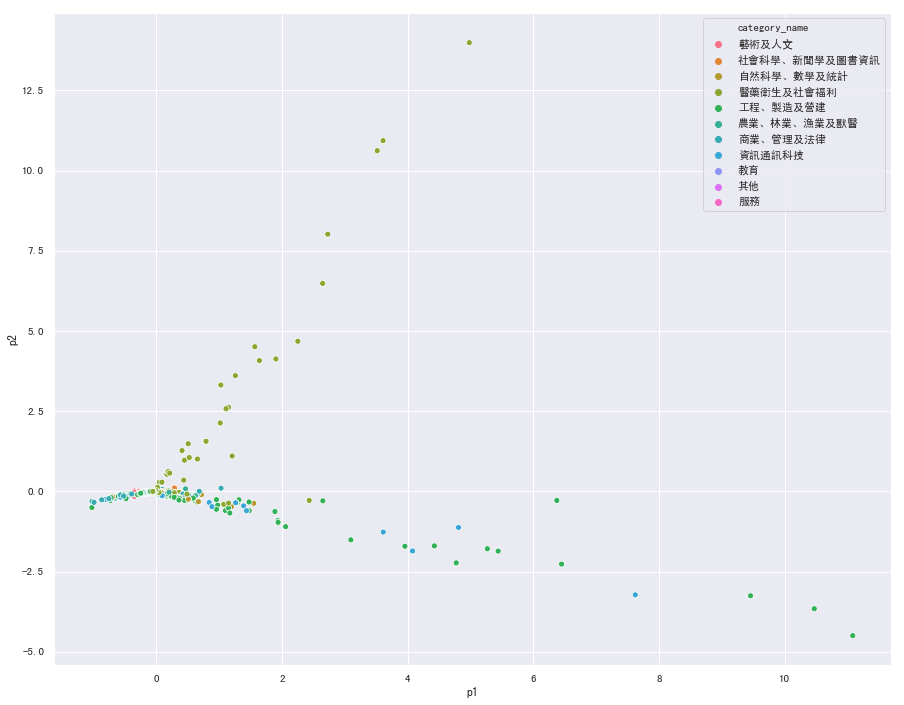

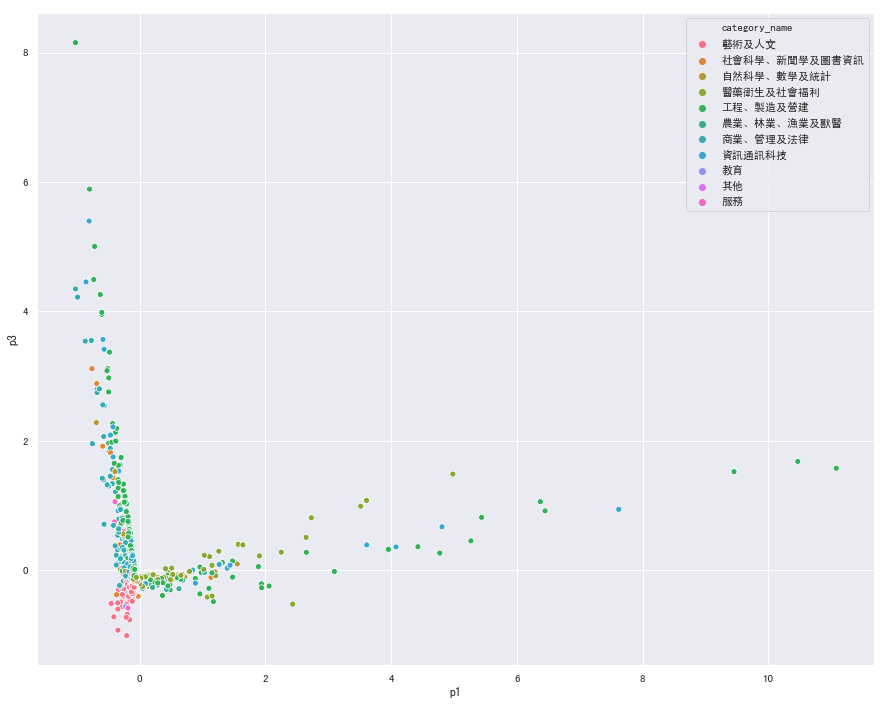

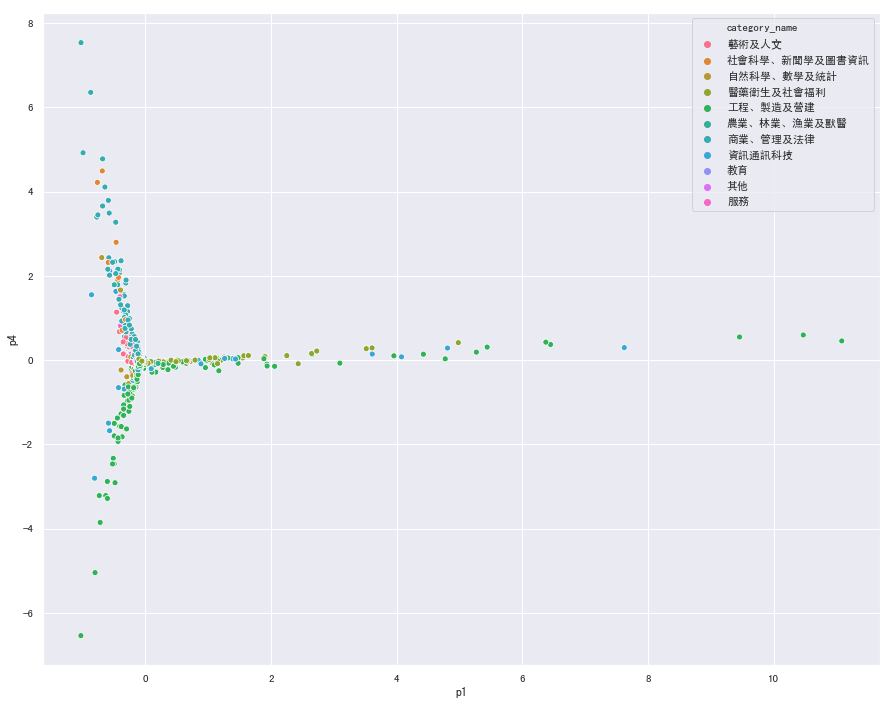

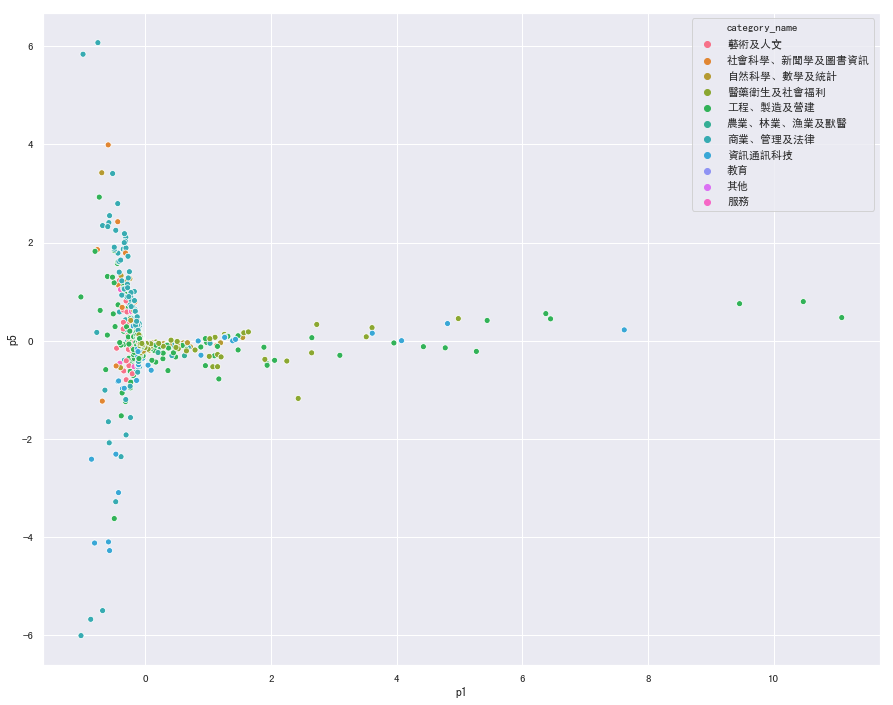

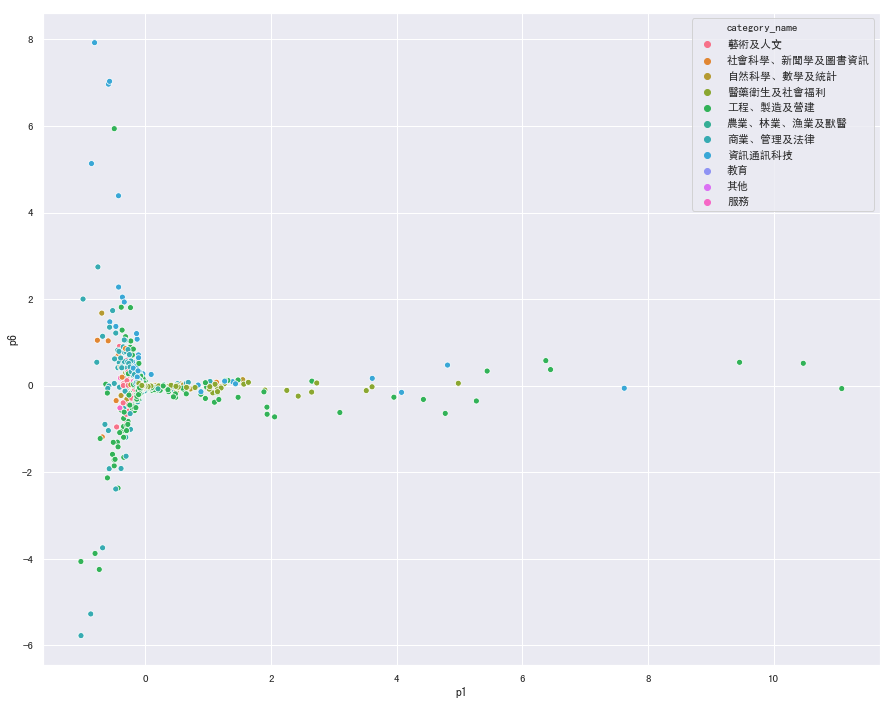

...

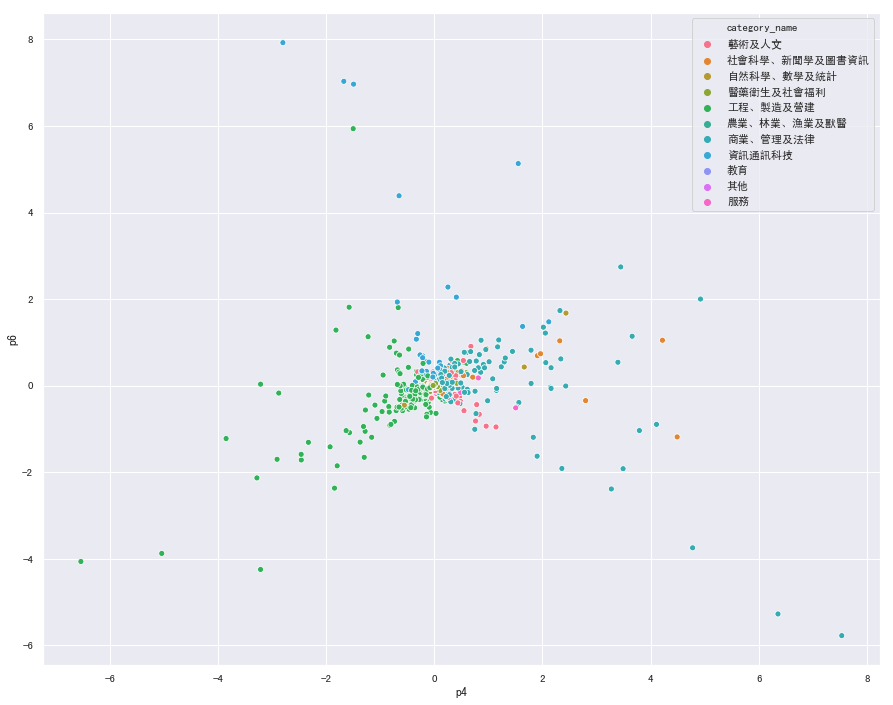

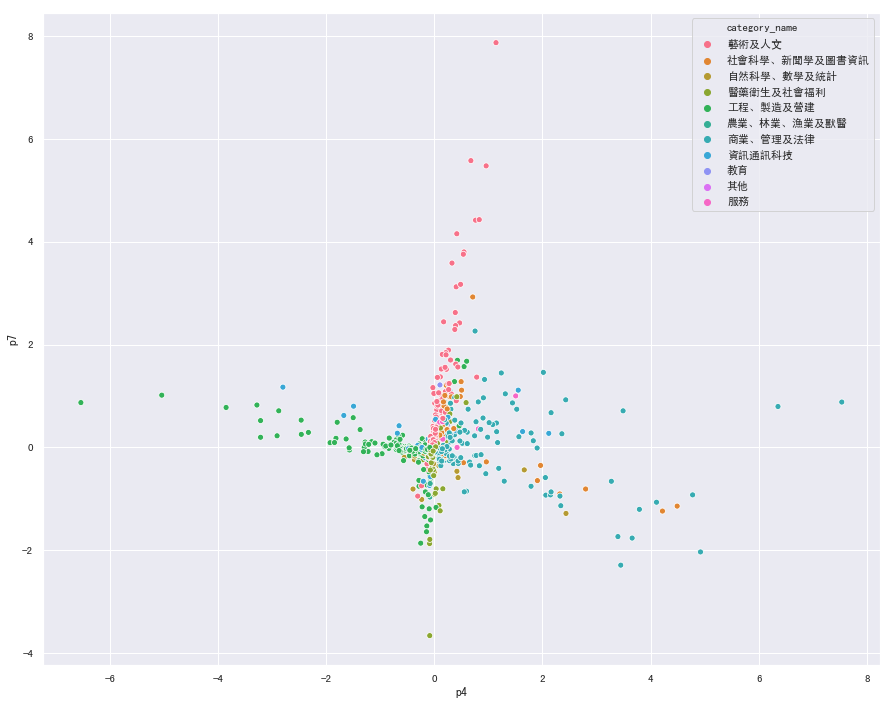

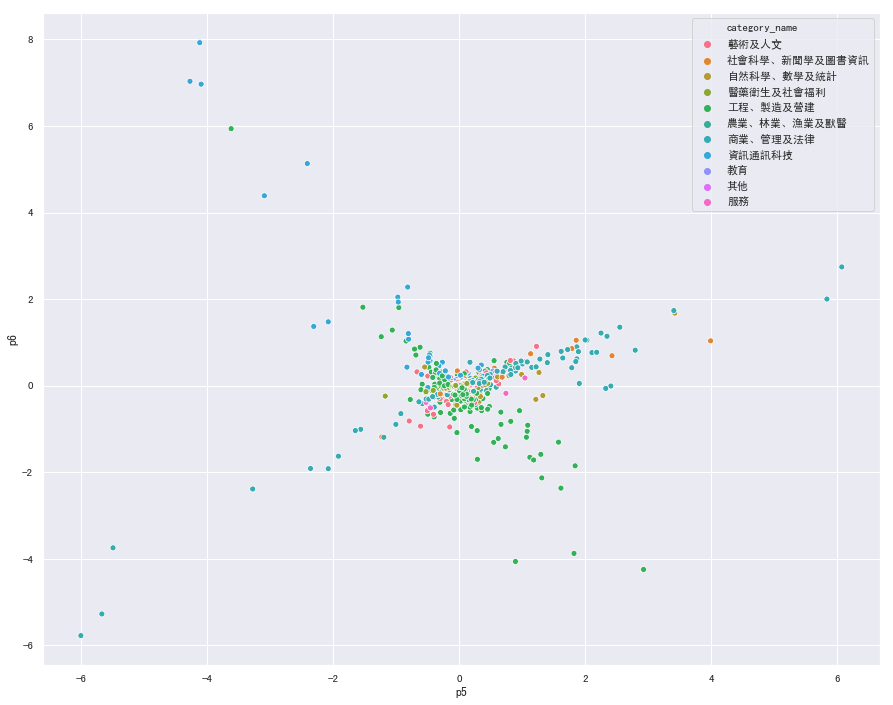

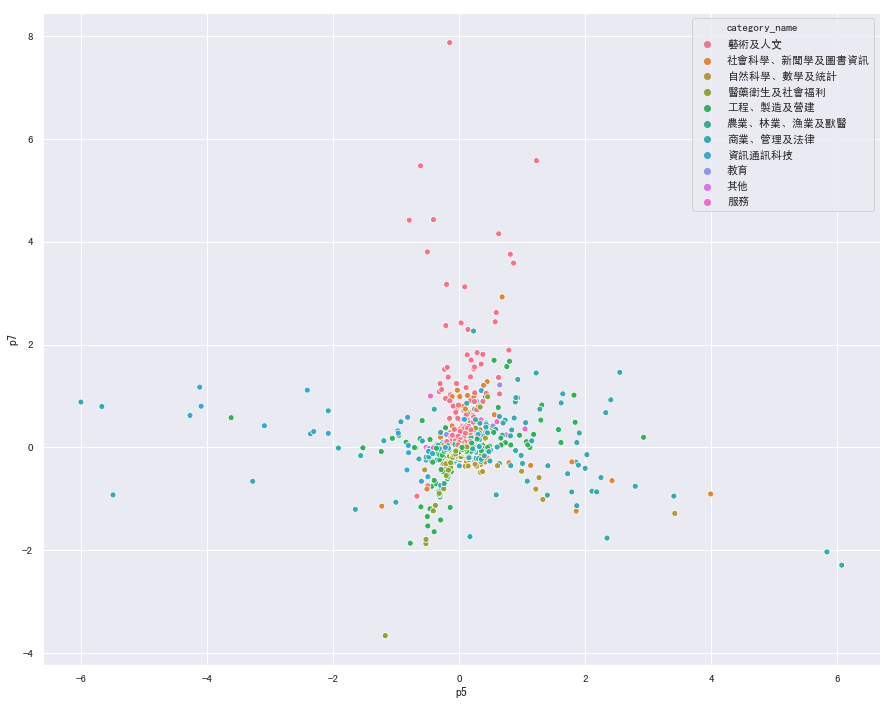

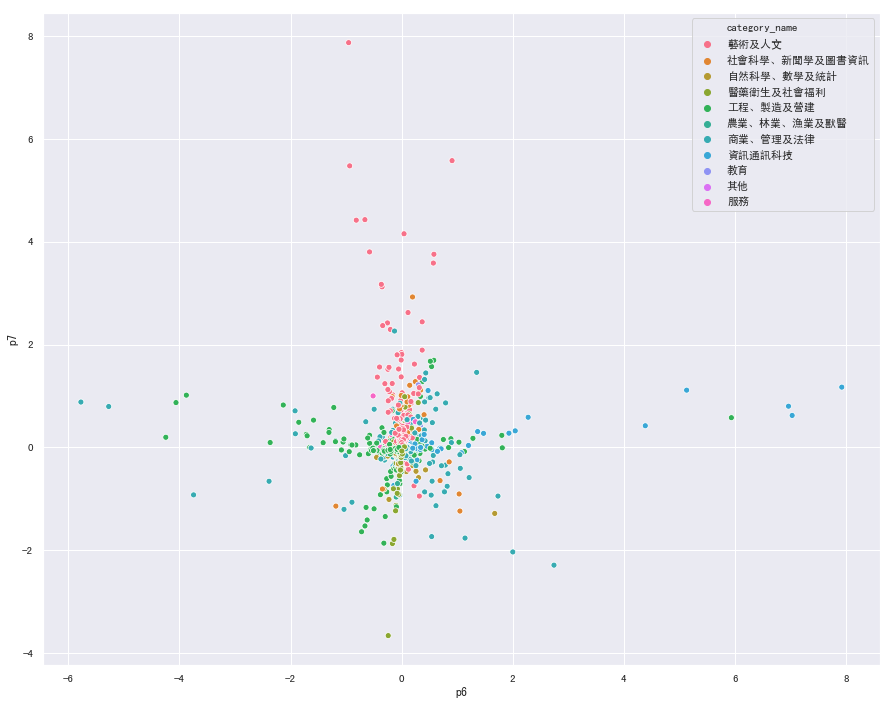

In [21]:
for i in range(1, 7):
    for j in range(i+1, 8):
        result = pd.DataFrame(transform, index = department_id, columns= ['p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8'])
        result['category_name'] = [0 for j in range(len(result))]
        for k in CATEGORY:
            name =  uname.loc[uname['category_id']== k]['category_name'].unique()[0] 
            result.loc[ result.index.isin(cat_dict[k]) , ['category_name']] = name
        ax = sns.scatterplot(x = 'p'+ str(i),
                             y= 'p'+ str(j),
                             data = result,
                             hue = 'category_name')
        
        plt.show()

component 4 and 7 has the best result

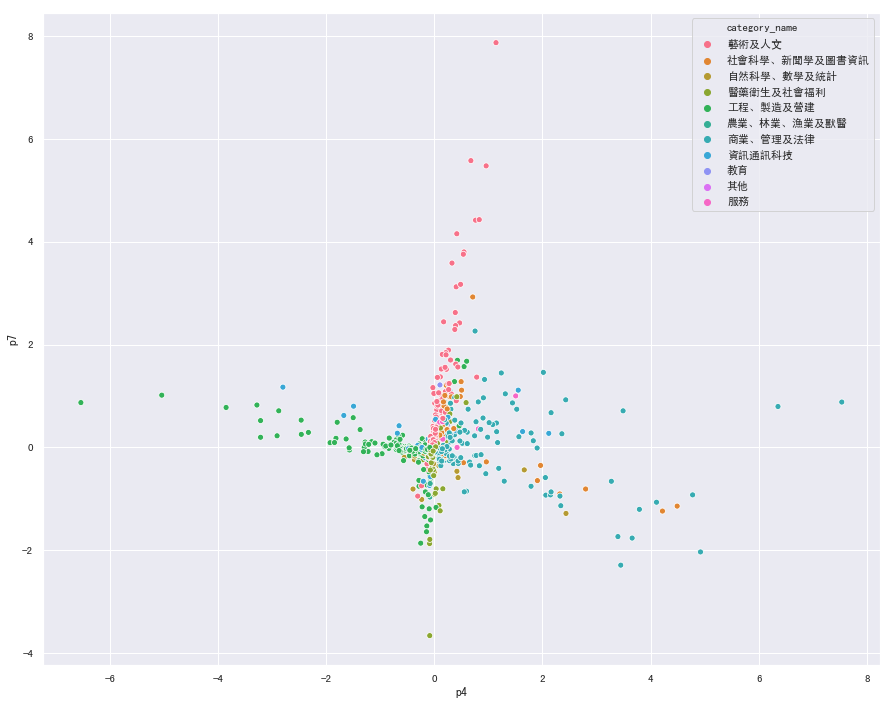

In [22]:
result = pd.DataFrame(transform, index = department_id, columns= ['p1', 'p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8'])
result['category_name'] = [0 for j in range(len(result))]
for k in CATEGORY:
    name =  uname.loc[uname['category_id']== k]['category_name'].unique()[0] 
    result.loc[ result.index.isin(cat_dict[k]) , ['category_name']] = name
ax = sns.scatterplot(x = 'p4',
                     y= 'p7',
                     data = result,
                     hue = 'category_name')

plt.show()

雖然大致上看得出一些分類的分群結果，仍有大量資料重疊。

Q2.2: Visualize academic department using multiple dimensional scaling. Consdier both the metric and non-metric settings. Discuss the result.

(1) metric MDS

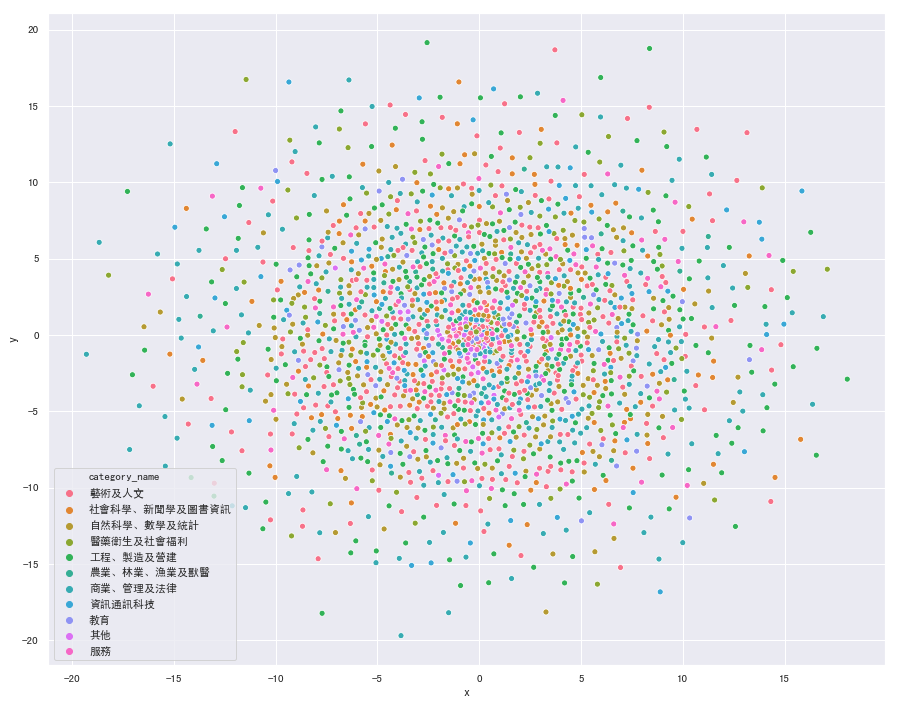

In [23]:
from sklearn.manifold import MDS

data = crosstab2.copy()
mds = MDS(n_components = 2, metric = True)
transform = mds.fit_transform(data)

result = pd.DataFrame(transform, index = department_id, columns= ['x','y'])
result['category_name'] = [0 for j in range(len(result))]
for k in CATEGORY:
    name =  uname.loc[uname['category_id']== k]['category_name'].unique()[0] 
    result.loc[ result.index.isin(cat_dict[k]) , ['category_name']] = name
ax = sns.scatterplot(x = 'x',
                     y= 'y',
                     data = result,
                     hue = 'category_name')

plt.show()

透過 metric MDS, 資料變得很發散，大多集中在原點，無法找到明顯規律

(2) non-metric MDS

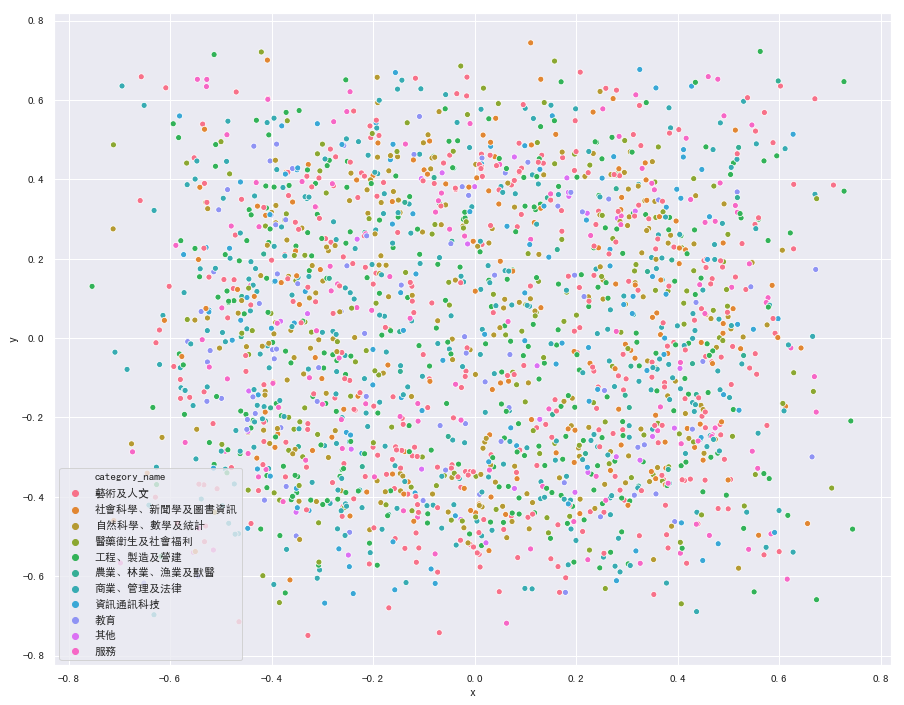

In [14]:
from sklearn.manifold import MDS

data = crosstab2.copy()
mds = MDS(n_components = 2, metric = False)
transform = mds.fit_transform(data)

result = pd.DataFrame(transform, index = department_id, columns= ['x','y'])
result['category_name'] = [0 for j in range(len(result))]
for k in CATEGORY:
    name =  uname.loc[uname['category_id']== k]['category_name'].unique()[0] 
    result.loc[ result.index.isin(cat_dict[k]) , ['category_name']] = name
ax = sns.scatterplot(x = 'x',
                     y= 'y',
                     data = result,
                     hue = 'category_name')

plt.show()

相較於前一個metric MDS, 資料更為發散，更沒有規律。

Q2.3: Visualize academic department using Locally Linear Embedding. Consider three variations:

(1) Use 20 neighbors to construct the weight matrix

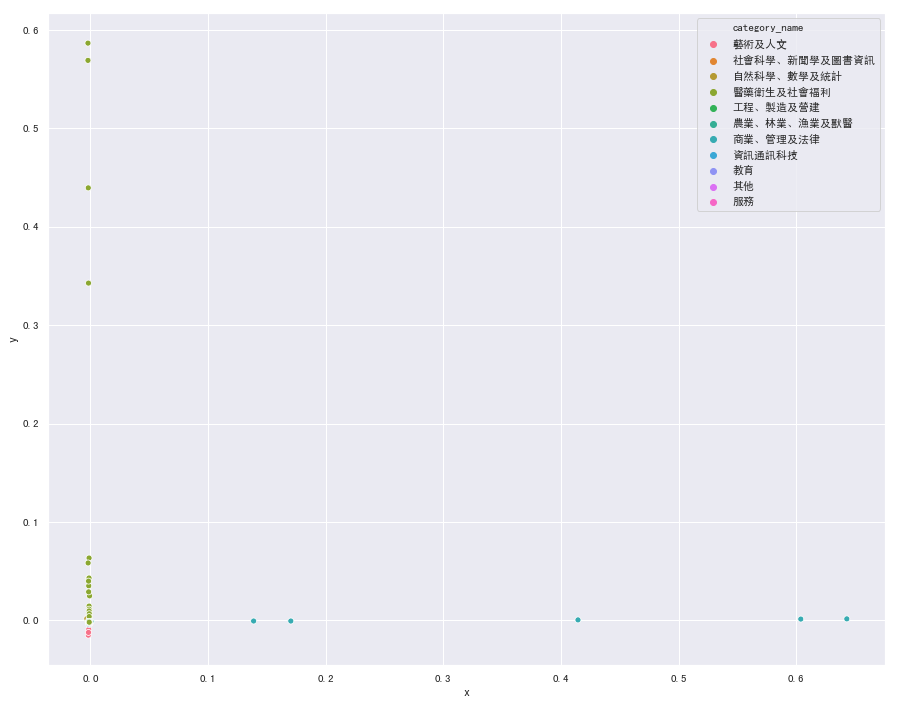

In [24]:
from sklearn.manifold import LocallyLinearEmbedding

lle = LocallyLinearEmbedding(n_components = 2, n_neighbors = 20)
transform = lle.fit_transform(crosstab2.copy())

result = pd.DataFrame(transform, index = department_id, columns= ['x','y'])
result['category_name'] = [0 for j in range(len(result))]
for k in CATEGORY:
    name =  uname.loc[uname['category_id']== k]['category_name'].unique()[0] 
    result.loc[ result.index.isin(cat_dict[k]) , ['category_name']] = name
ax = sns.scatterplot(x = 'x',
                     y= 'y',
                     data = result,
                     hue = 'category_name')

plt.show()

lle 分群結果不佳

(2) Use 40 neighbors to construct the weight matrix

In [35]:
from sklearn.manifold import LocallyLinearEmbedding


lle = LocallyLinearEmbedding(n_components = 2, n_neighbors = 40)
transform = lle.fit_transform(crosstab2.copy())

result = pd.DataFrame(transform, index = department_id, columns= ['x','y'])
result['category_name'] = [0 for j in range(len(result))]
for k in CATEGORY:
    name =  uname.loc[uname['category_id']== k]['category_name'].unique()[0] 
    result.loc[ result.index.isin(cat_dict[k]) , ['category_name']] = name
ax = sns.scatterplot(x = 'x',
                     y= 'y',
                     data = result,
                     hue = 'category_name')

plt.show()

MemoryError: 

40 neighbors對於電腦負擔太大，無法順利跑出。

(3) Perform PCA transformation first, and use the first 100 principle components as the input to LLE (with 20 neighbors). Discuss the result.

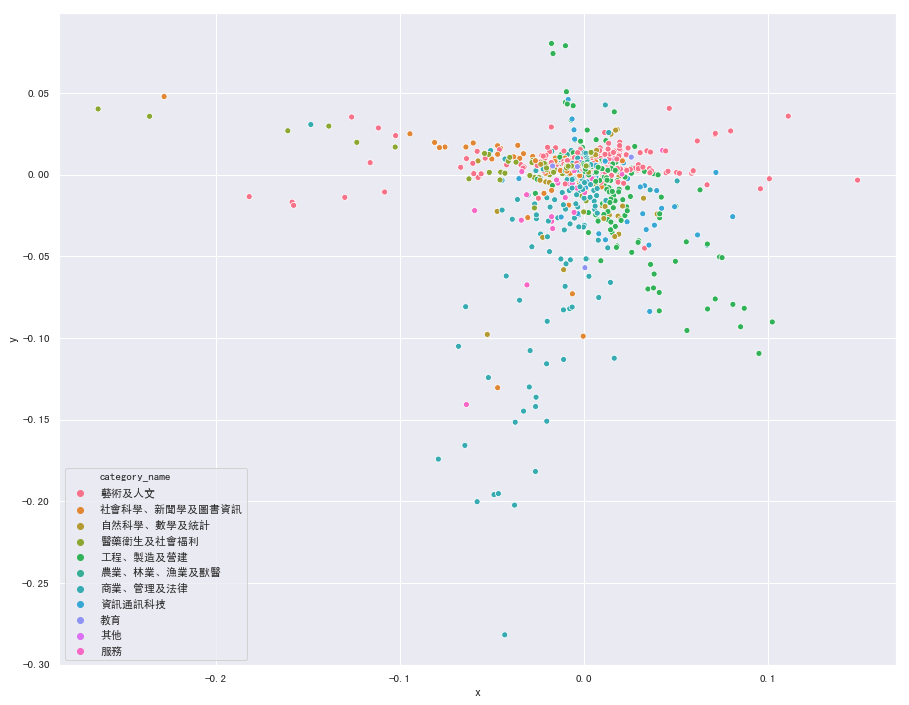

In [19]:
pca = PCA(n_components = 100)
data = crosstab2.copy()
transform = pca.fit_transform(data)
lle = LocallyLinearEmbedding(n_components=2, n_neighbors = 20)
transform2 = lle.fit_transform(transform)

result = pd.DataFrame(transform2, index = department_id, columns= ['x','y'])
result['category_name'] = [0 for j in range(len(result))]
for k in CATEGORY:
    name =  uname.loc[uname['category_id']== k]['category_name'].unique()[0] 
    result.loc[ result.index.isin(cat_dict[k]) , ['category_name']] = name
ax = sns.scatterplot(x = 'x',
                     y= 'y',
                     data = result,
                     hue = 'category_name')

plt.show()

仍有大量點重疊，不利於觀察分群結果

Q2.4: Visualize academic department using Kernel PCA. You should at least consider the RBF and Cosine kernel. It is your responsibility to select reasonably good kernel parameters. Discuss the result.

(1) RBF Kernel 

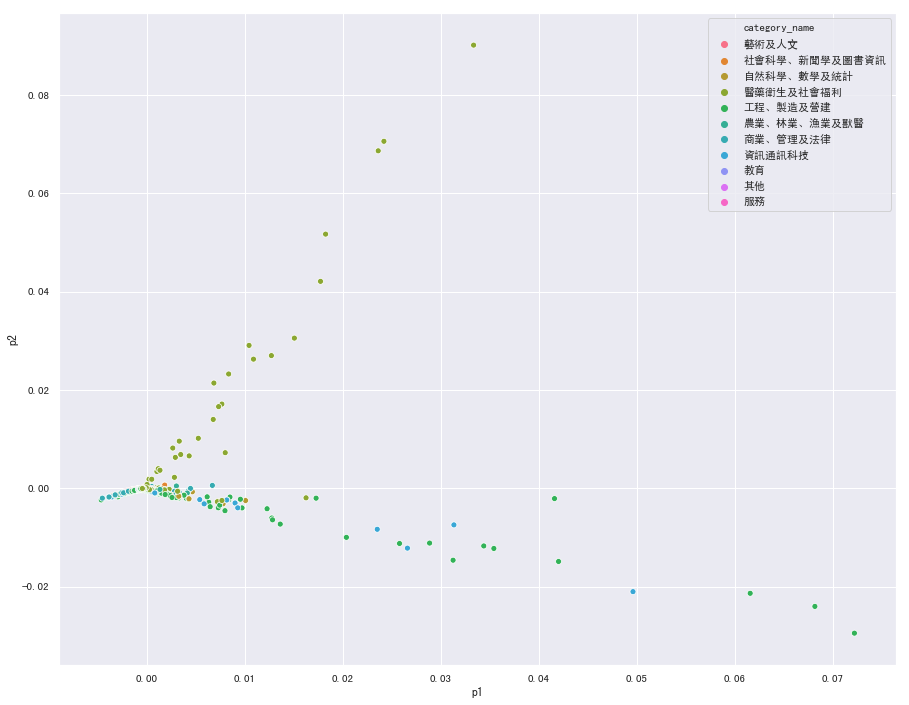

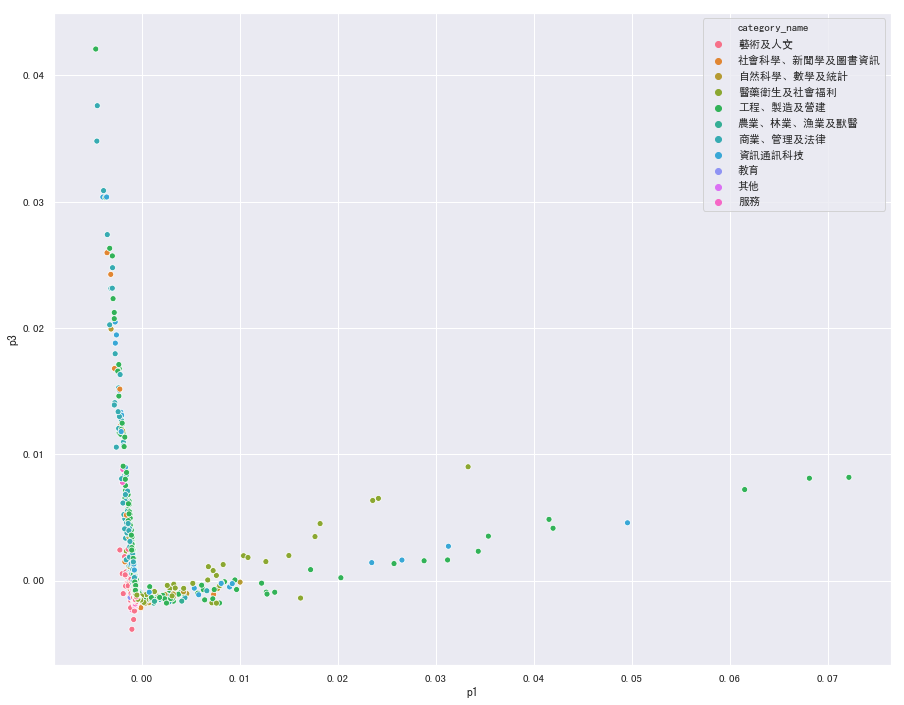

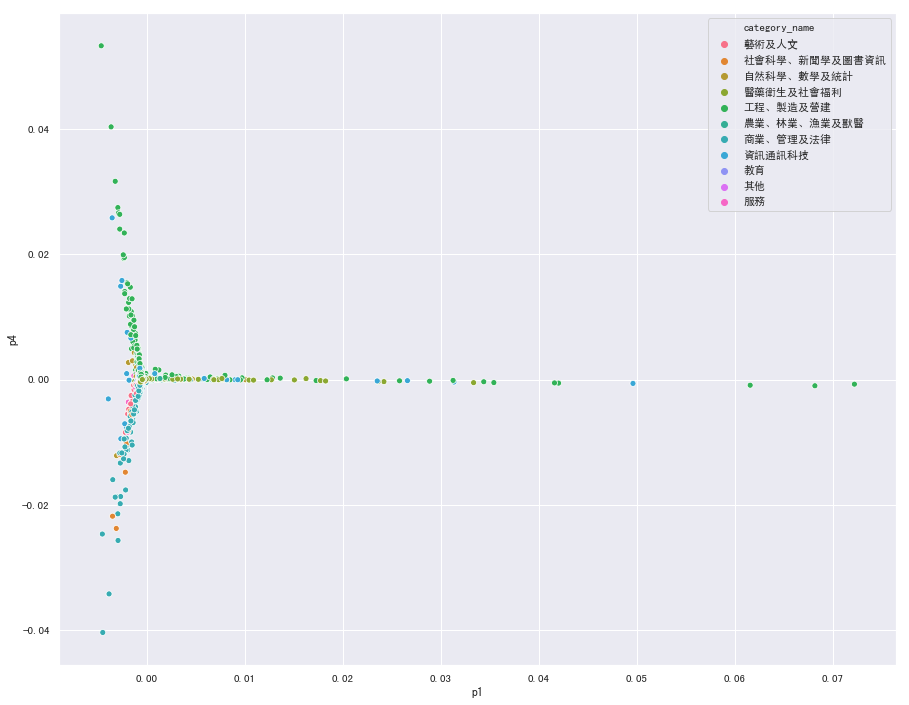

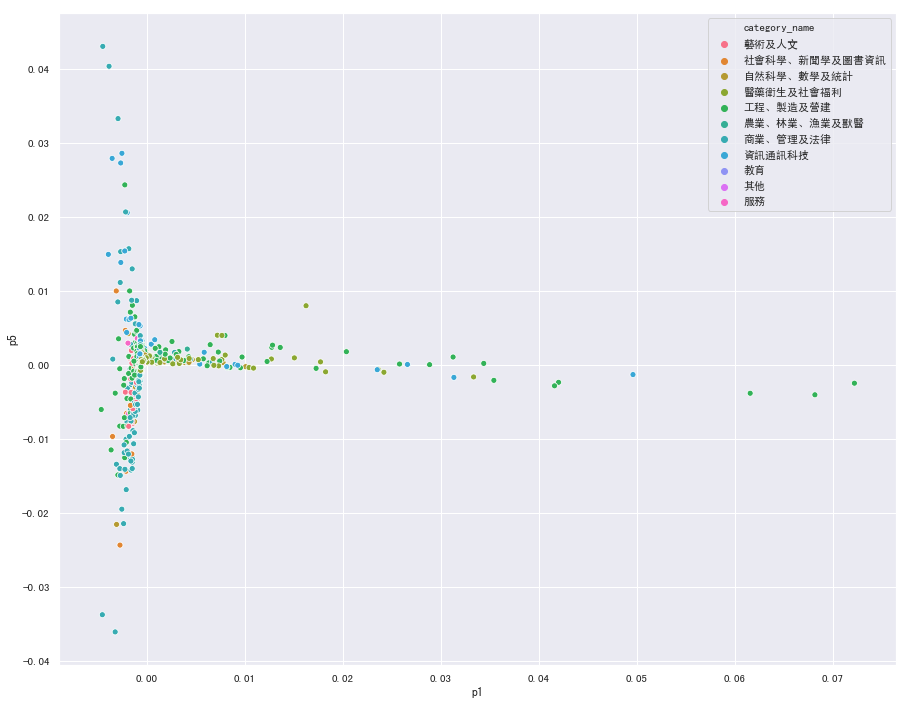

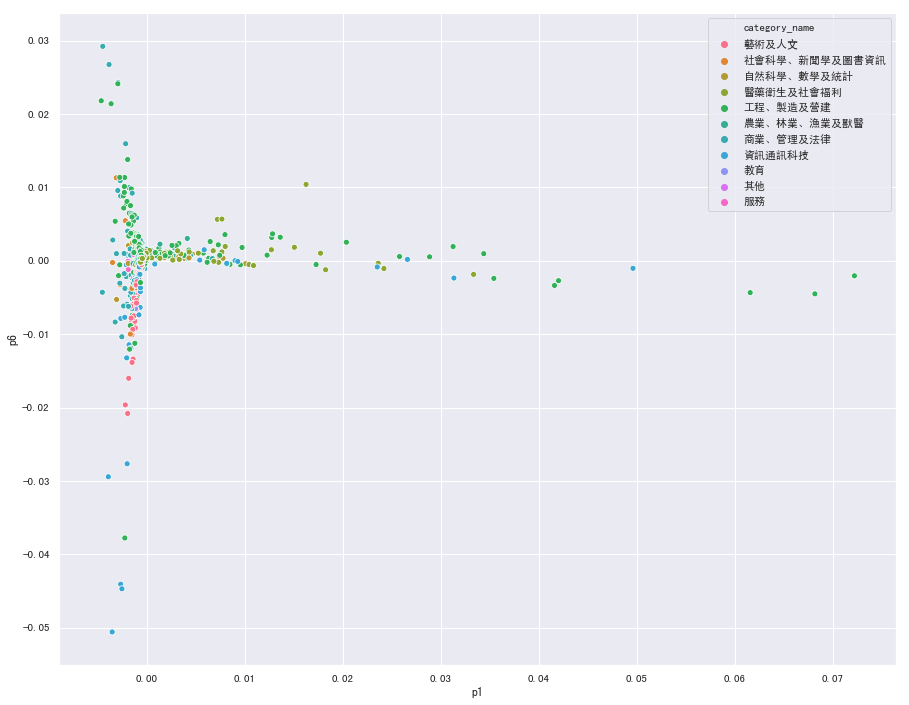

...

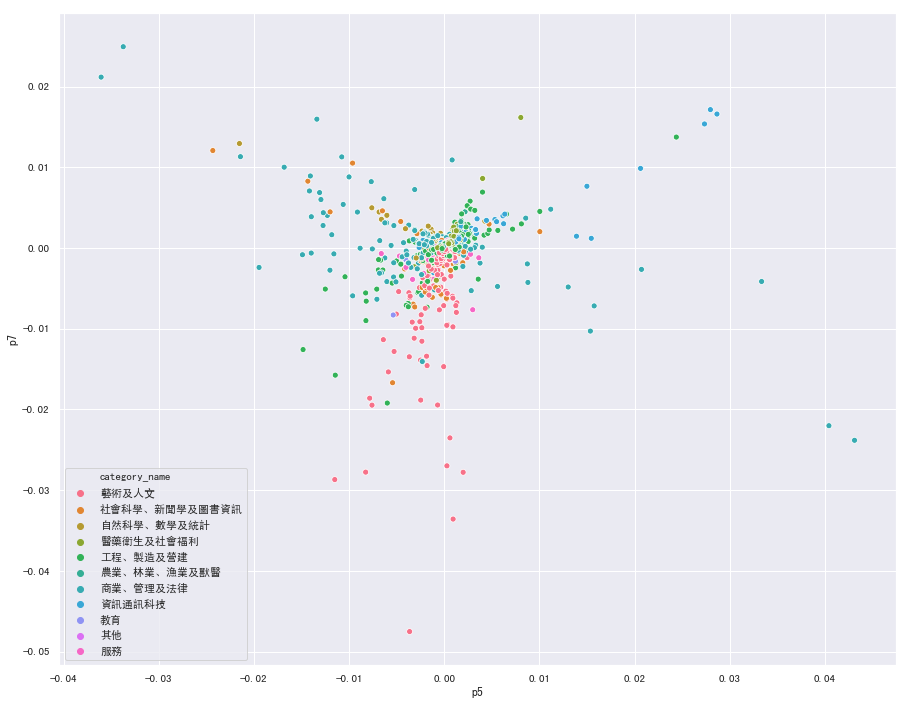

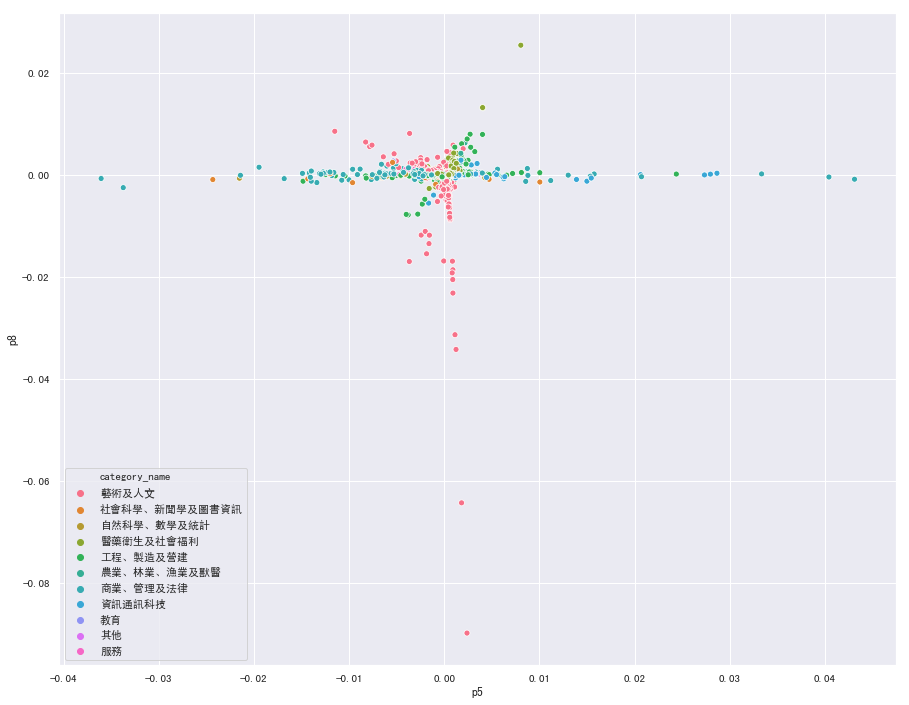

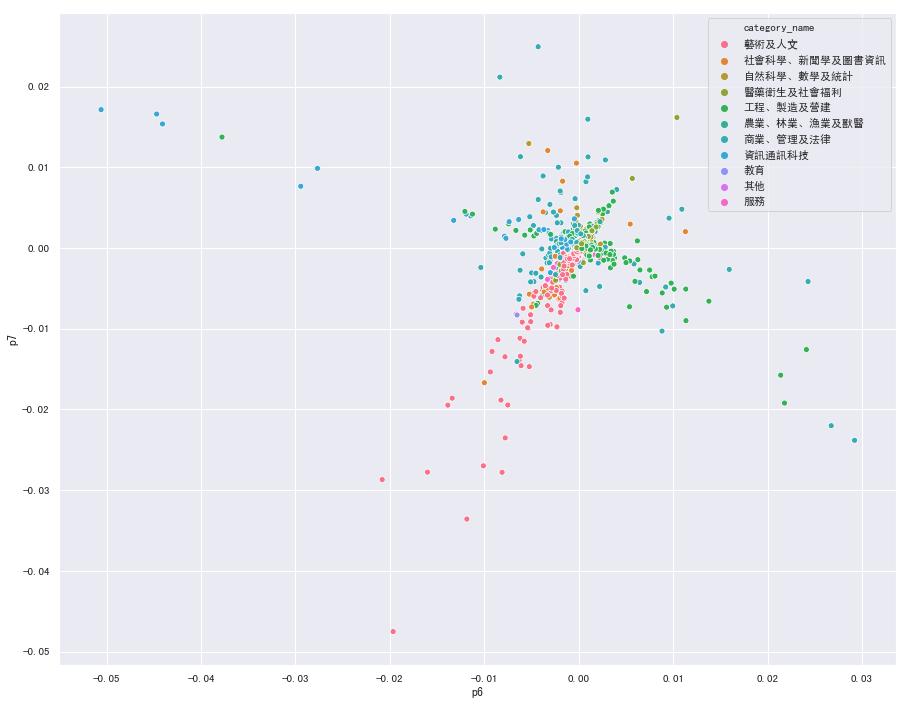

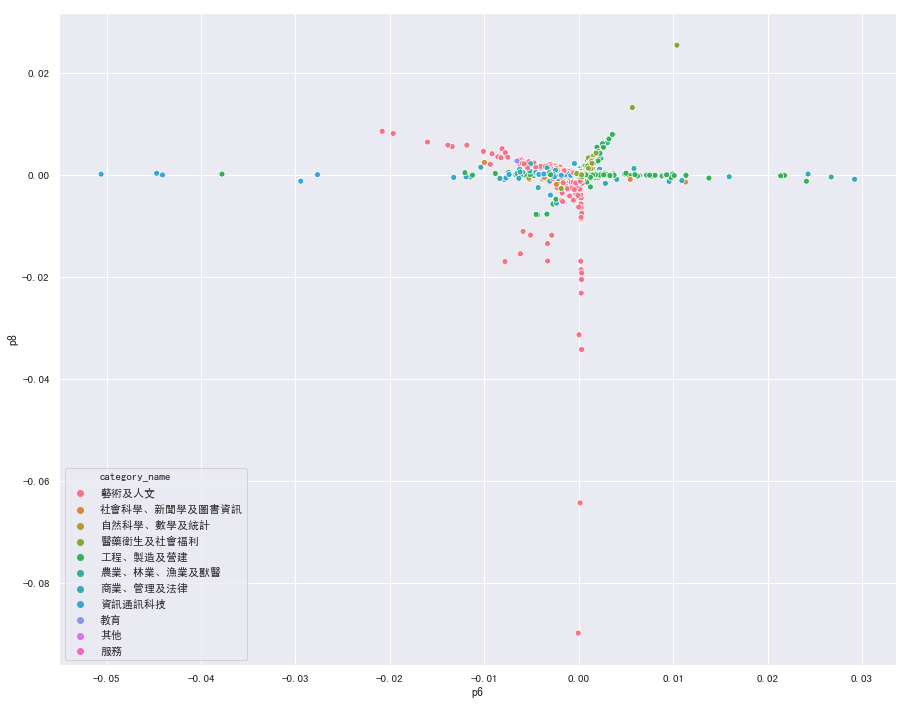

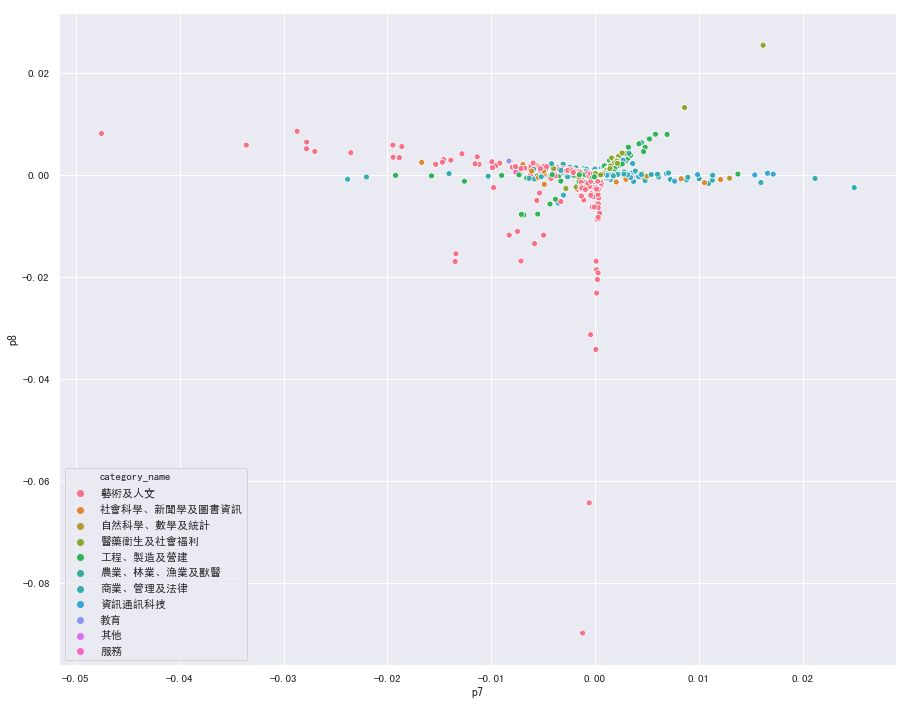

In [25]:
from sklearn.decomposition import KernelPCA

kernel_pca = KernelPCA(n_components = 8, kernel='rbf')
transform = kernel_pca.fit_transform(crosstab2.copy())

for i in range(1, 8):
    for j in range(i+1, 9):
        
        result = pd.DataFrame(transform, index = department_id, columns= ['p1','p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8'])
        result['category_name'] = [0 for j in range(len(result))]
        for k in CATEGORY:
            name =  uname.loc[uname['category_id']== k]['category_name'].unique()[0] 
            result.loc[ result.index.isin(cat_dict[k]) , ['category_name']] = name
        ax = sns.scatterplot(x = 'p'+ str(i),
                             y= 'p' + str(j),
                             data = result,
                             hue = 'category_name')
        plt.show()
        

Select component 4 and 7

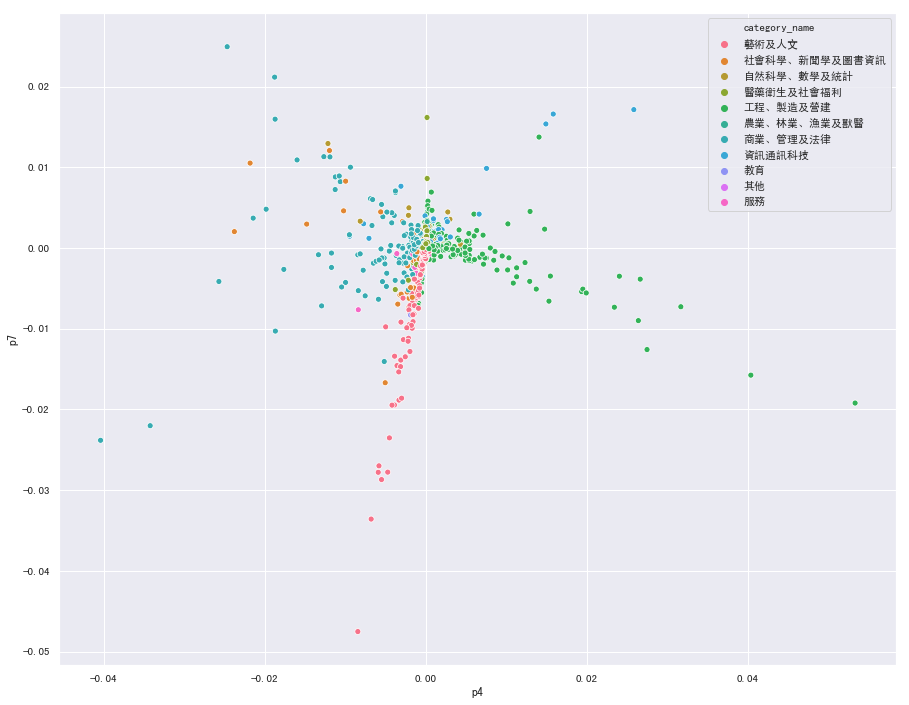

In [26]:
result = pd.DataFrame(transform, index = department_id, columns= ['p1','p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8'])
result['category_name'] = [0 for j in range(len(result))]
for k in CATEGORY:
    name =  uname.loc[uname['category_id']== k]['category_name'].unique()[0] 
    result.loc[ result.index.isin(cat_dict[k]) , ['category_name']] = name
ax = sns.scatterplot(x = 'p4',
                     y= 'p7',
                     data = result,
                     hue = 'category_name')
plt.show()

工程製造及營建領域有相對最明顯的分群結果。

(2) Cosine Kernel

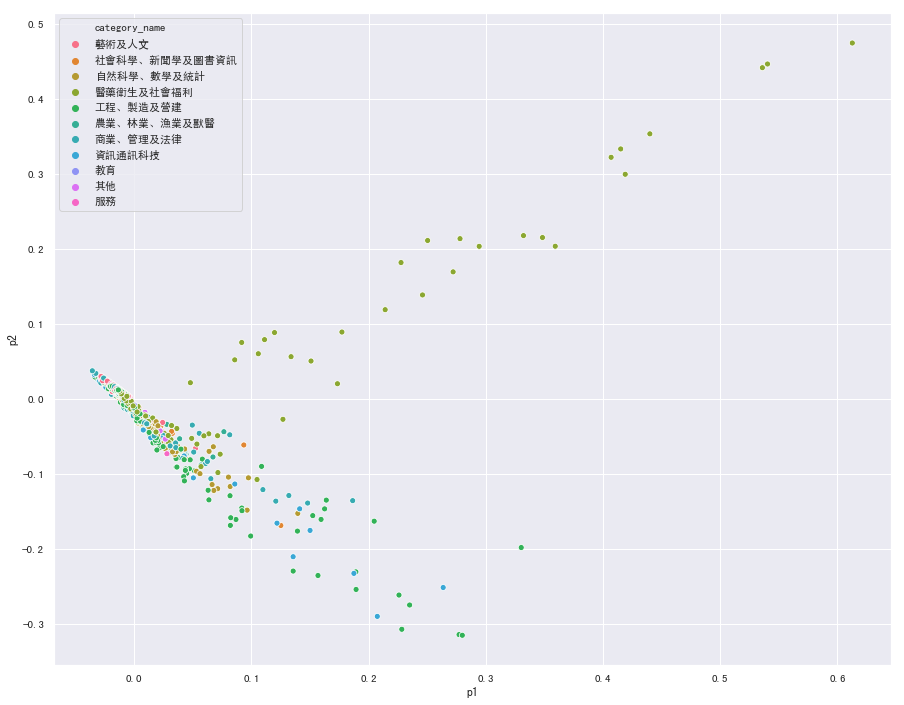

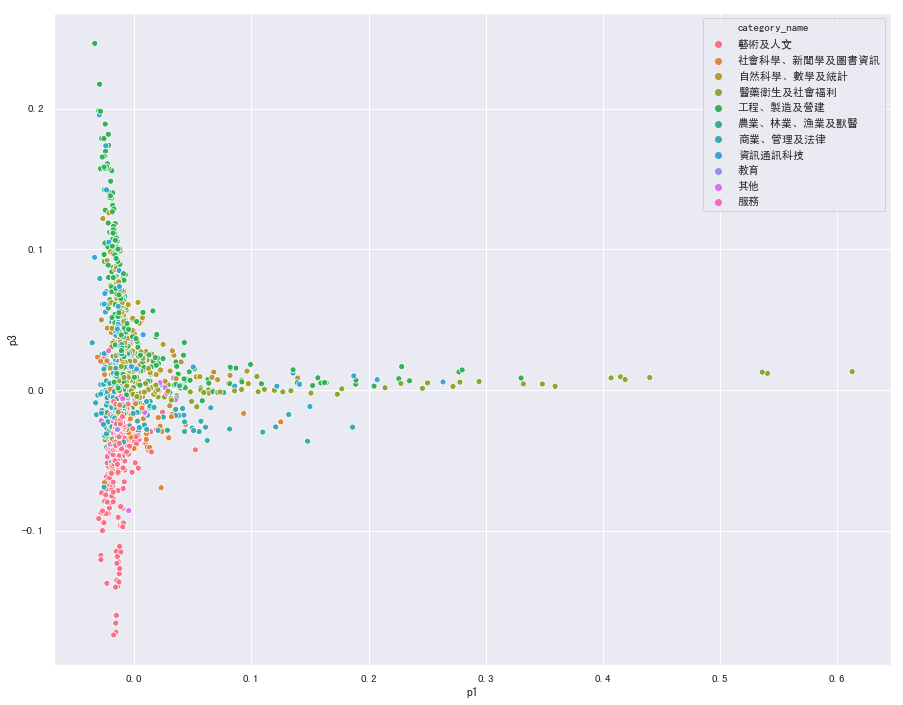

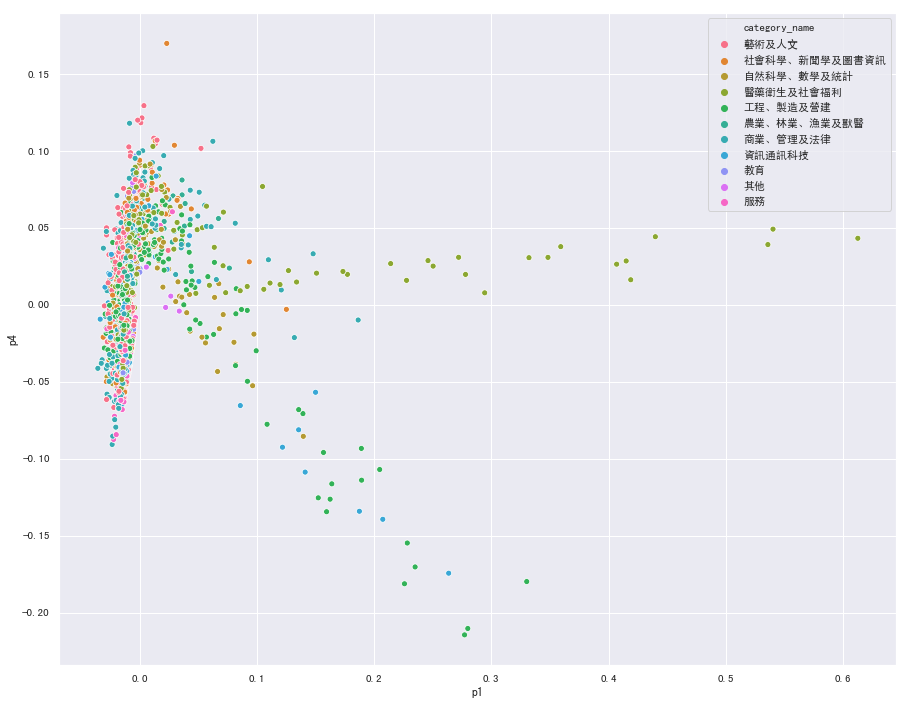

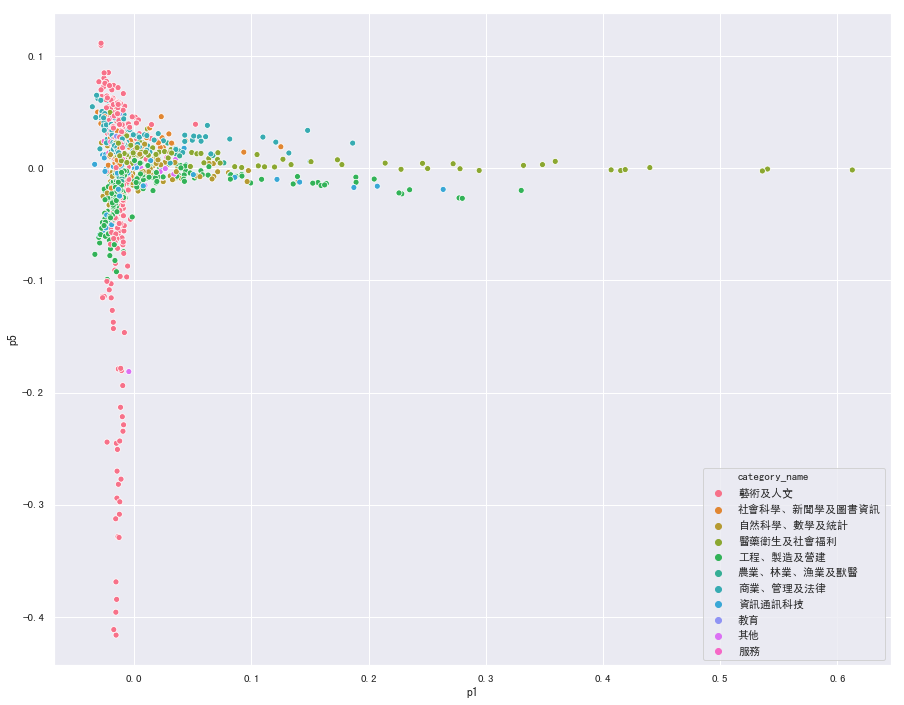

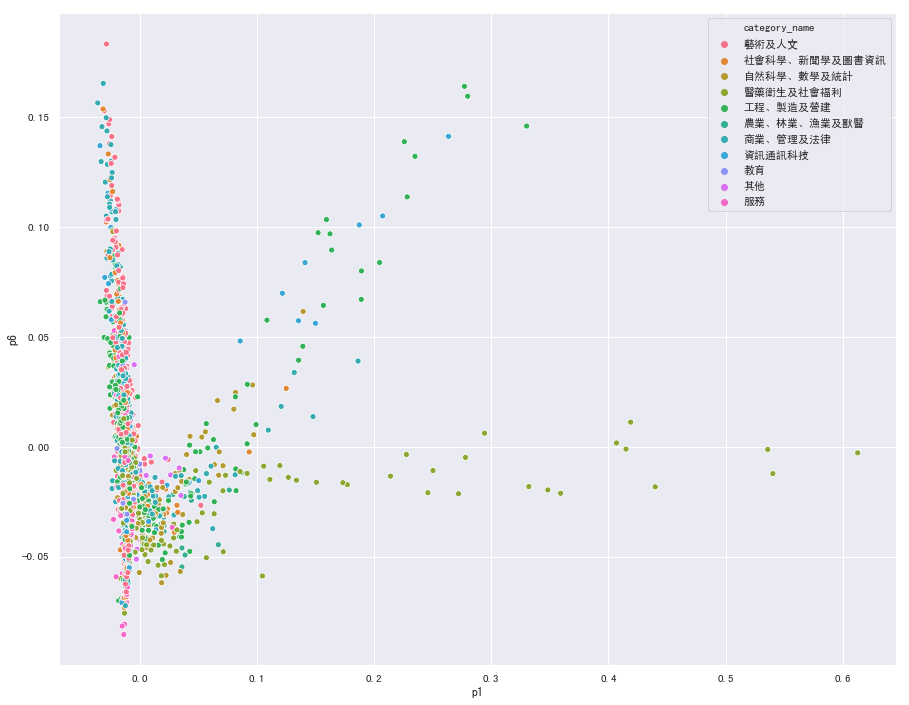

...

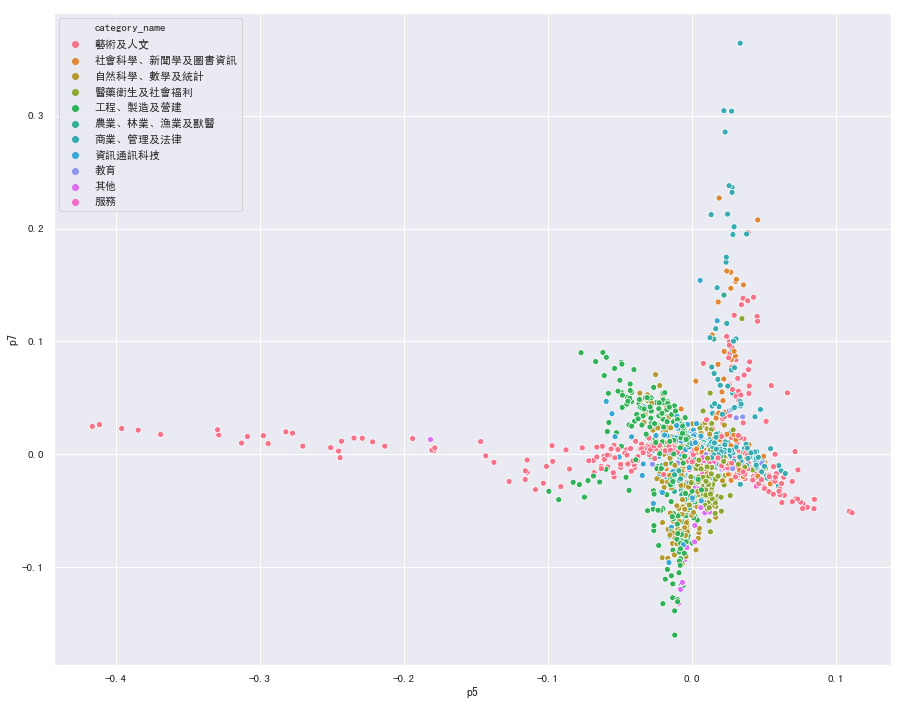

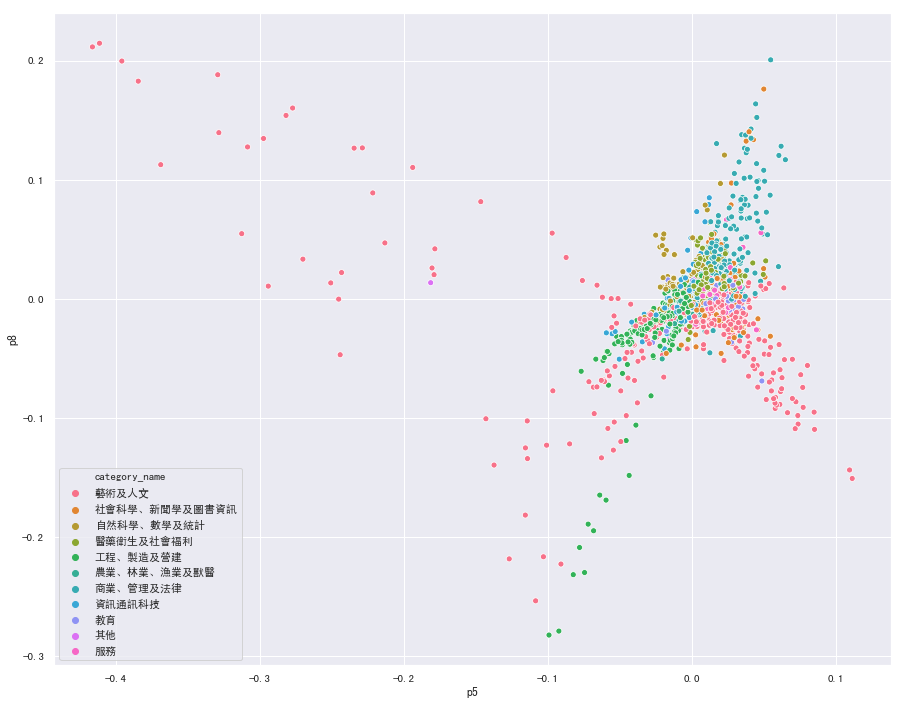

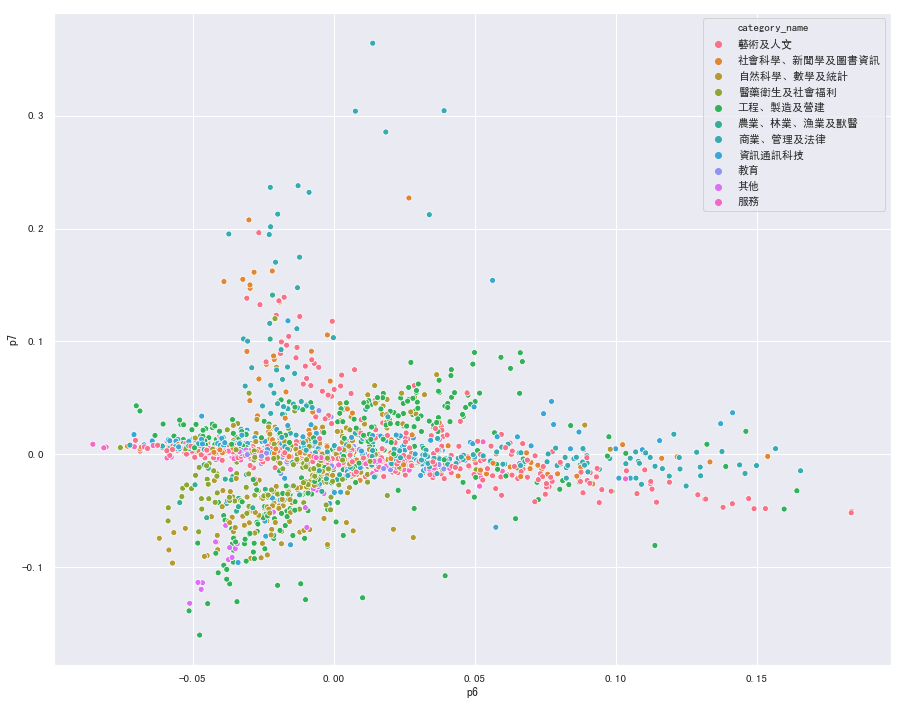

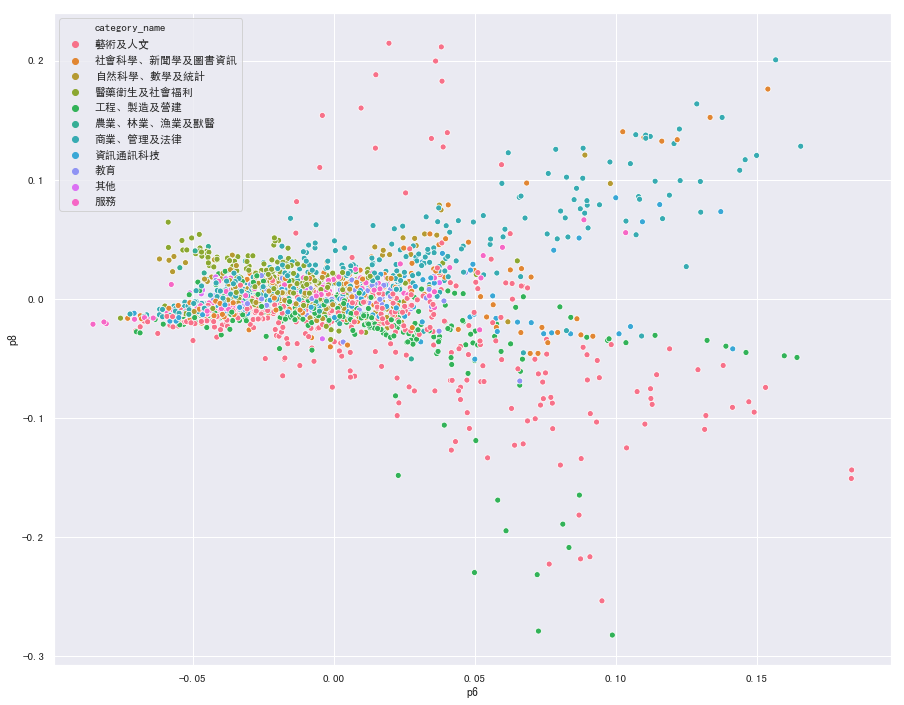

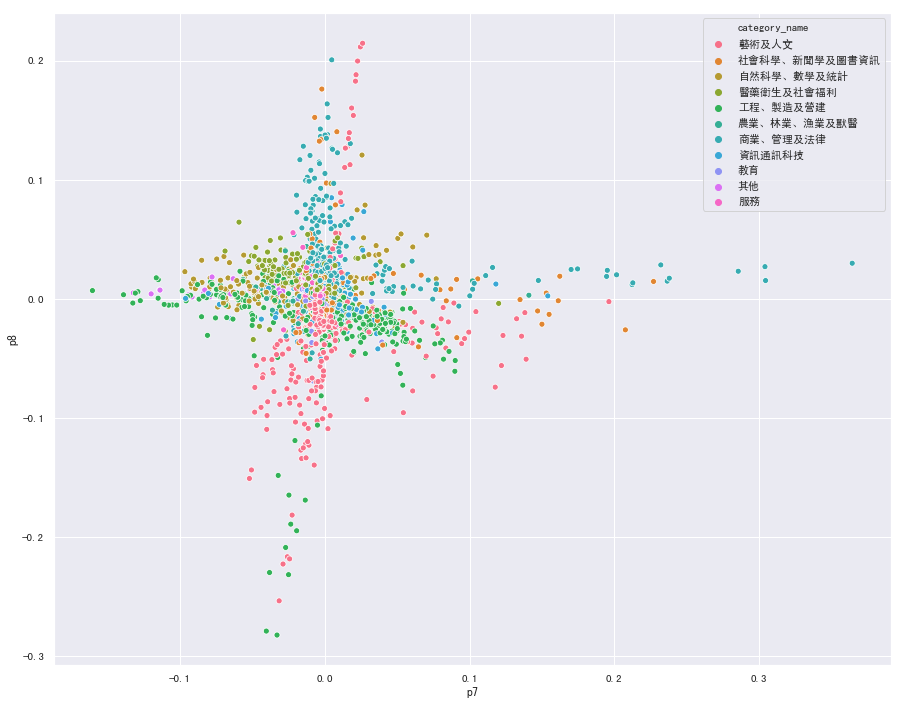

In [27]:
from sklearn.decomposition import KernelPCA

kernel_pca = KernelPCA(n_components = 8, kernel='cosine')
transform = kernel_pca.fit_transform(crosstab2.copy())

for i in range(1, 8):
    for j in range(i+1, 9):
        
        result = pd.DataFrame(transform, index = department_id, columns= ['p1','p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8'])
        result['category_name'] = [0 for j in range(len(result))]
        for k in CATEGORY:
            name =  uname.loc[uname['category_id']== k]['category_name'].unique()[0] 
            result.loc[ result.index.isin(cat_dict[k]) , ['category_name']] = name
        ax = sns.scatterplot(x = 'p'+ str(i),
                             y= 'p' + str(j),
                             data = result,
                             hue = 'category_name')
        plt.show()
        

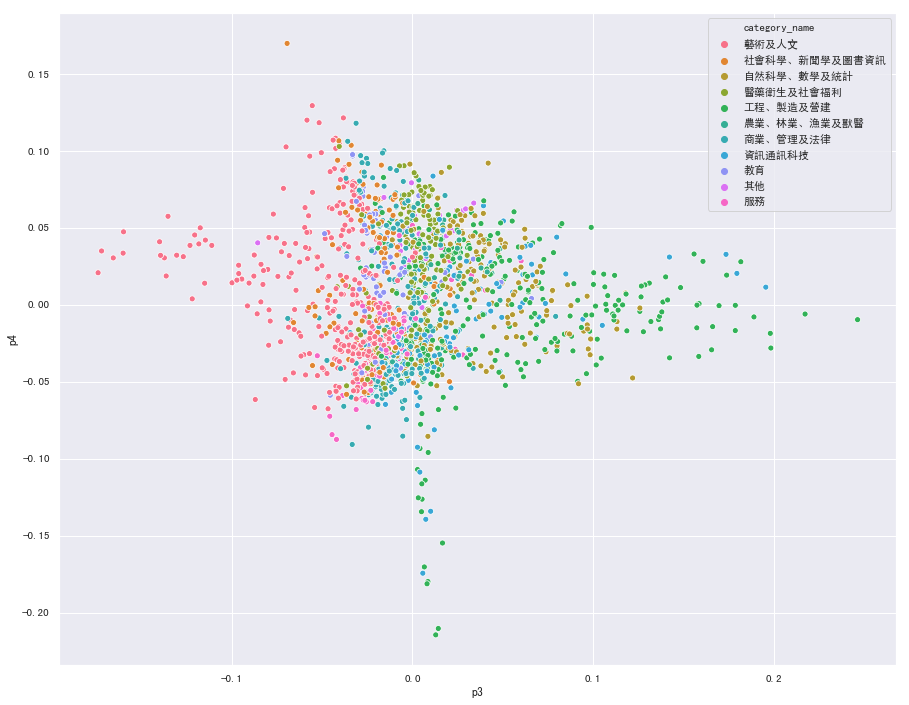

In [28]:
result = pd.DataFrame(transform, index = department_id, columns= ['p1','p2', 'p3', 'p4', 'p5', 'p6', 'p7', 'p8'])
result['category_name'] = [0 for j in range(len(result))]
for k in CATEGORY:
    name =  uname.loc[uname['category_id']== k]['category_name'].unique()[0] 
    result.loc[ result.index.isin(cat_dict[k]) , ['category_name']] = name
ax = sns.scatterplot(x = 'p3',
                     y= 'p4',
                     data = result,
                     hue = 'category_name')
plt.show()

雖然有較明顯的分群結果 不過過於集中

Q2.5: Visualize academic department using t-SNE. You should consider at least the Euclidian, Cosine, and Jaccard metric. Set numpy random seed so that your results can be repeated. Discuss the result.

(1) Euclidian

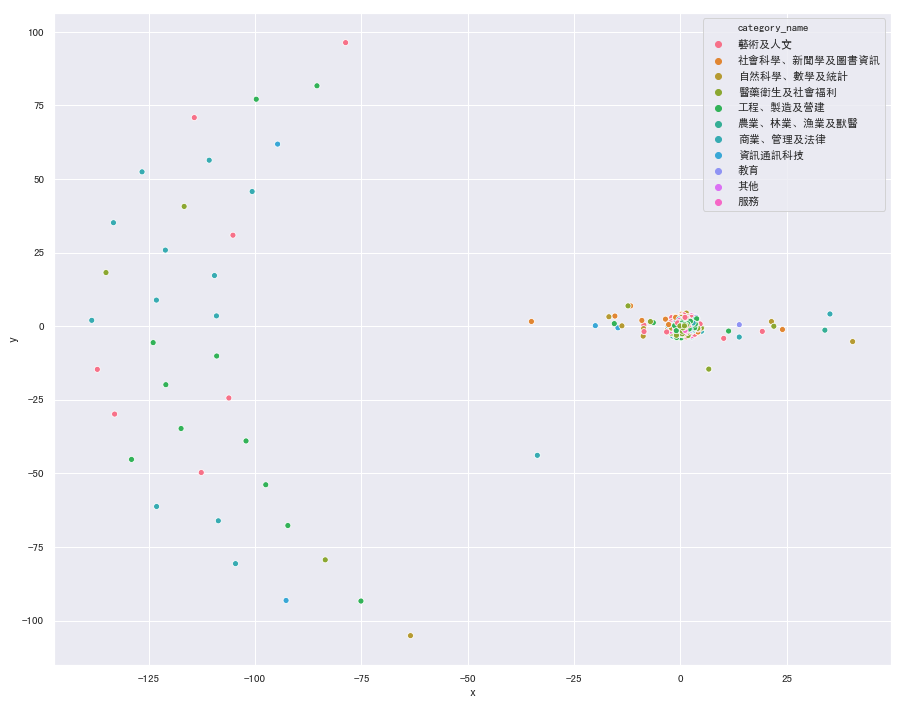

In [29]:
from sklearn.manifold import TSNE

transform = TSNE(n_components=2).fit_transform(crosstab2.copy())

result = pd.DataFrame(transform, index = department_id, columns= ['x','y'])
result['category_name'] = [0 for j in range(len(result))]
for k in CATEGORY:
    name =  uname.loc[uname['category_id']== k]['category_name'].unique()[0] 
    result.loc[ result.index.isin(cat_dict[k]) , ['category_name']] = name
ax = sns.scatterplot(x = 'x',
                     y= 'y',
                     data = result,
                     hue = 'category_name')

plt.show()

大部分的資料都集中在原點附近

(2) Cosine

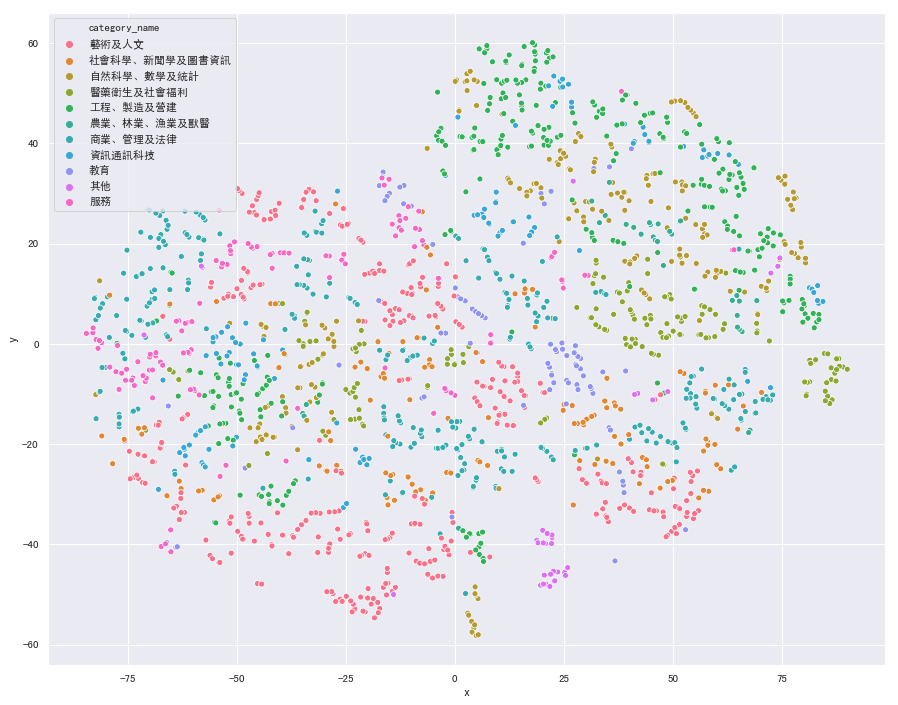

In [33]:
from sklearn.manifold import TSNE

transform = TSNE(n_components=2,metric ='cosine').fit_transform(crosstab2.copy())

result = pd.DataFrame(transform, index = department_id, columns= ['x','y'])
result['category_name'] = [0 for j in range(len(result))]
for k in CATEGORY:
    name =  uname.loc[uname['category_id']== k]['category_name'].unique()[0] 
    result.loc[ result.index.isin(cat_dict[k]) , ['category_name']] = name
ax = sns.scatterplot(x = 'x',
                     y= 'y',
                     data = result,
                     hue = 'category_name')

plt.show()

分群效果明顯比之前的都好

(3) Jaccard

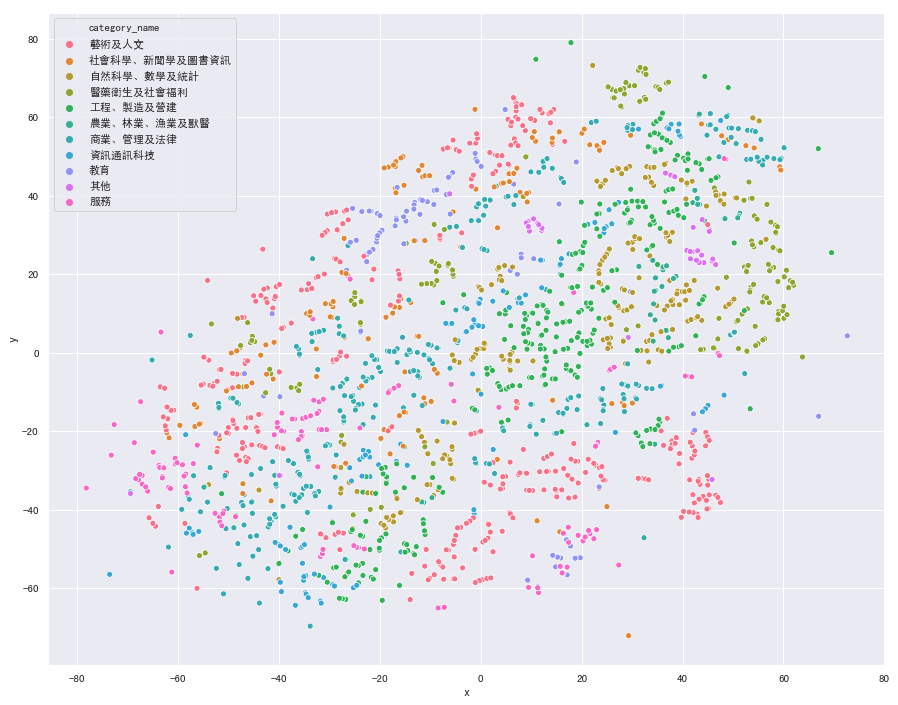

In [34]:
from sklearn.manifold import TSNE

transform = TSNE(n_components=2,metric = 'jaccard').fit_transform(crosstab2.copy())

result = pd.DataFrame(transform, index = department_id, columns= ['x','y'])
result['category_name'] = [0 for j in range(len(result))]
for k in CATEGORY:
    name =  uname.loc[uname['category_id']== k]['category_name'].unique()[0] 
    result.loc[ result.index.isin(cat_dict[k]) , ['category_name']] = name
ax = sns.scatterplot(x = 'x',
                     y= 'y',
                     data = result,
                     hue = 'category_name')

plt.show()

與cosine法相似